### Installing Required Libraries

In [3]:
pip install pandas numpy matplotlib seaborn scikit-learn xgboost

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.1.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


### Imports

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, LearningCurveDisplay, ValidationCurveDisplay
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, LabelEncoder
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import PredictionErrorDisplay
from sklearn.inspection import PartialDependenceDisplay
import warnings
warnings.filterwarnings("ignore")


### Data Loading and initial review

In [5]:
df = pd.read_csv(r'data/data.csv')
display(df.head())
print(df.info())
print(df.describe())
print(df.isnull().sum())


,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
0,2014-05-02 00:00:00,313000.0,3.0,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133,USA
1,2014-05-02 00:00:00,2384000.0,5.0,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,WA 98119,USA
2,2014-05-02 00:00:00,342000.0,3.0,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042,USA
3,2014-05-02 00:00:00,420000.0,3.0,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008,USA
4,2014-05-02 00:00:00,550000.0,4.0,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052,USA


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4600 entries, 0 to 4599
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           4600 non-null   object 
 1   price          4600 non-null   float64
 2   bedrooms       4600 non-null   float64
 3   bathrooms      4600 non-null   float64
 4   sqft_living    4600 non-null   int64  
 5   sqft_lot       4600 non-null   int64  
 6   floors         4600 non-null   float64
 7   waterfront     4600 non-null   int64  
 8   view           4600 non-null   int64  
 9   condition      4600 non-null   int64  
 10  sqft_above     4600 non-null   int64  
 11  sqft_basement  4600 non-null   int64  
 12  yr_built       4600 non-null   int64  
 13  yr_renovated   4600 non-null   int64  
 14  street         4600 non-null   object 
 15  city           4600 non-null   object 
 16  statezip       4600 non-null   object 
 17  country        4600 non-null   object 
dtypes: float

In [6]:
le = LabelEncoder()
df['city'] = le.fit_transform(df['city'])

### EDA

In [7]:
req_columns = [i for i in df.columns if df[i].dtype != 'object']
df_corrected = df[req_columns]
df_corrected.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,city
0,313000.0,3.0,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,36
1,2384000.0,5.0,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,35
2,342000.0,3.0,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,18
3,420000.0,3.0,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,3
4,550000.0,4.0,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,31


In [8]:
df_corrected['Total_Rooms'] = df_corrected['bedrooms'] + df_corrected['bathrooms']
df_corrected['Built_sqft'] = df_corrected['sqft_living'] + df_corrected['sqft_above']+ df_corrected['sqft_basement']
df_corrected['Age'] = 2026 - df_corrected['yr_built']
df_corrected['sqft_per_room'] = df_corrected['Built_sqft'] / df_corrected['Total_Rooms']
df_corrected['renovated'] = df_corrected['yr_renovated'].apply(lambda x: 1 if x > 0 else 0)

<Axes: >

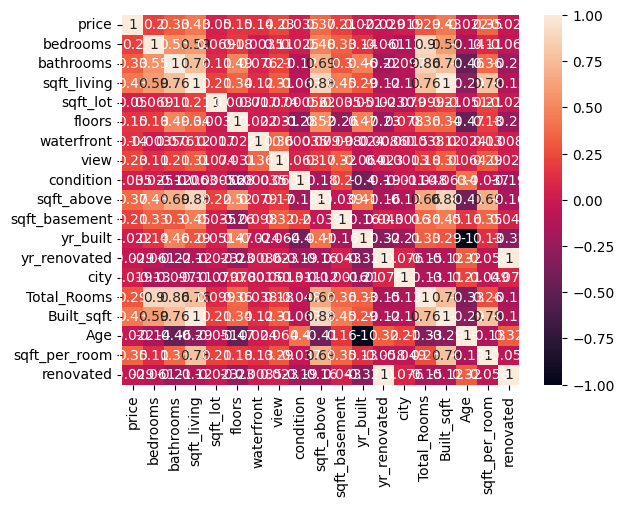

In [9]:
sns.heatmap(df_corrected.corr(), annot=True)

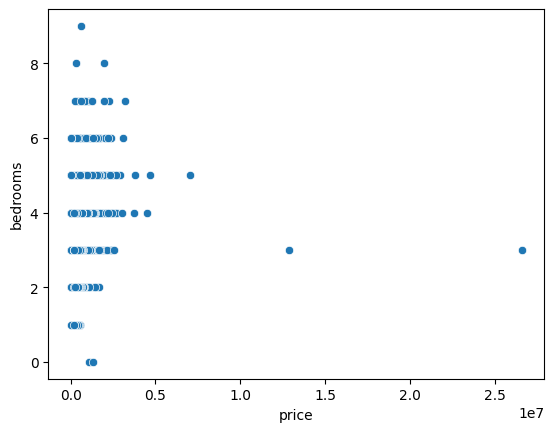

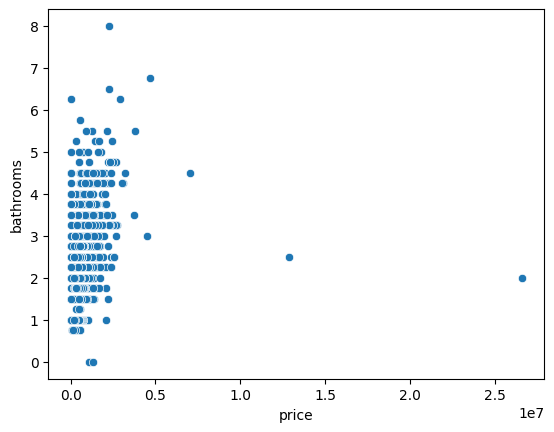

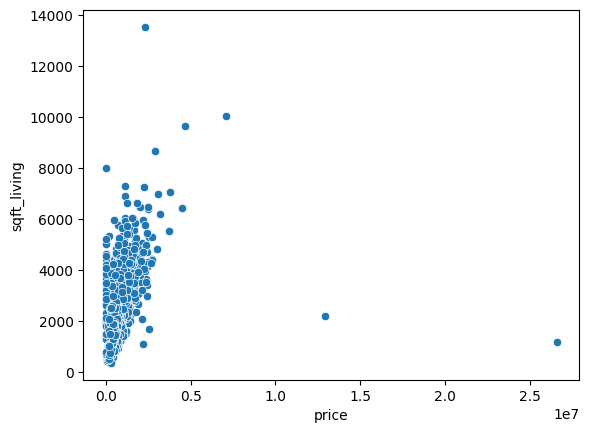

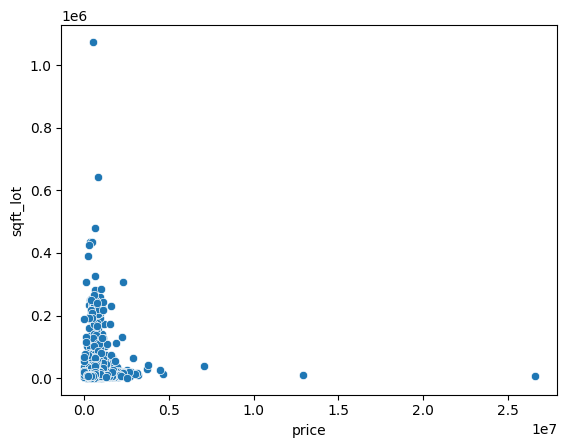

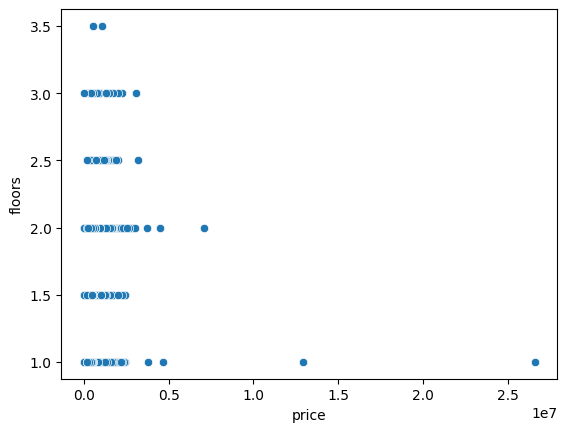

...

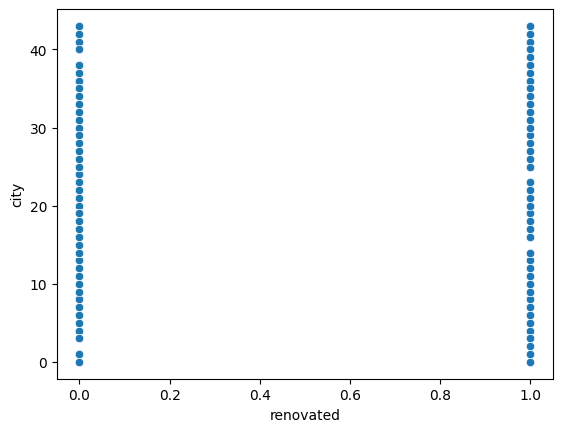

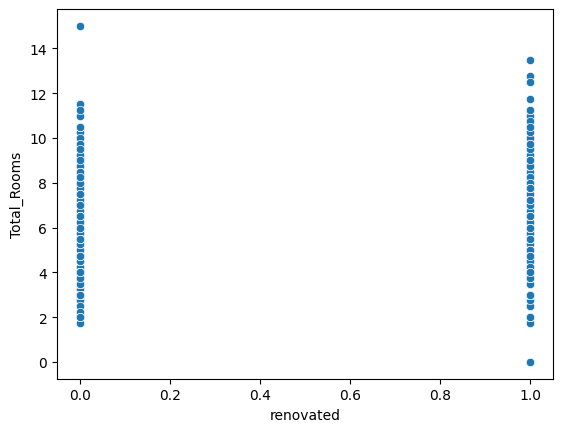

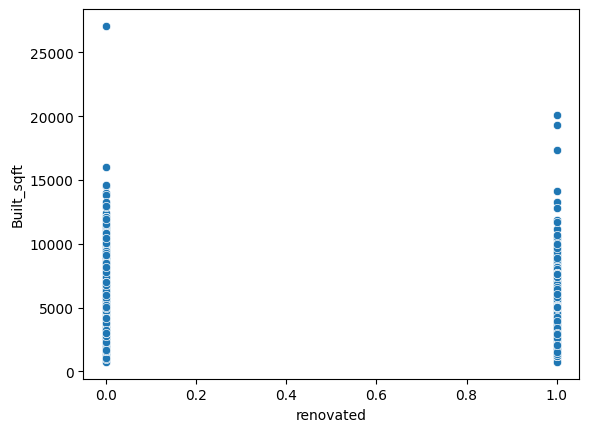

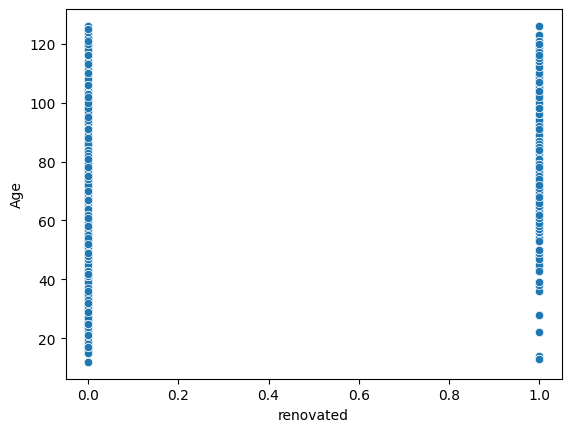

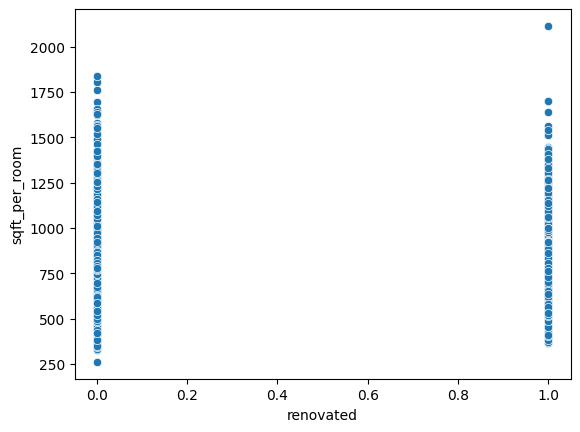

In [10]:
for i in df_corrected.columns:
    for j in df_corrected.columns:
        if i != j:
            sns.scatterplot(data=df_corrected, x=i, y=j)
            plt.show()


In [11]:
df['bedrooms'].max()

np.float64(9.0)

In [12]:
df_corrected = df_corrected[(df_corrected["price"]<3500000.0) & (df_corrected["bedrooms"]<9) & (df_corrected["sqft_living"]<12000) & (df_corrected['bedrooms']>1) & (df_corrected['bedrooms']<8)]

In [13]:
print(len(df)," ", len(df_corrected))

4600   4549


<Axes: xlabel='price', ylabel='bedrooms'>

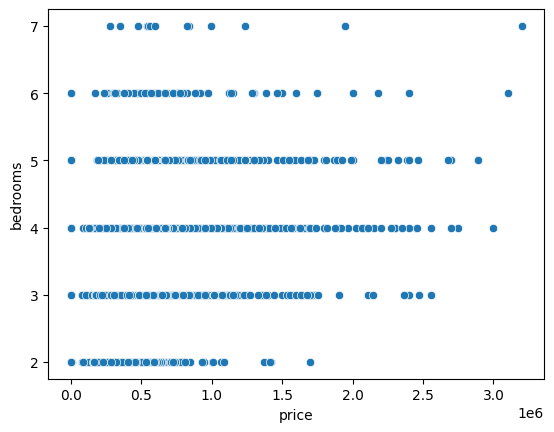

In [14]:
sns.scatterplot(x='price', y='bedrooms', data=df_corrected)    

### Preprocessing

In [48]:
def call_model(model):
    reg = model()
    print("Model:", model.__name__)
    
    # Fit
    reg.fit(X_train, y_train)
    y_pred = reg.predict(X_test)

    # Metrics
    print('Mean squared error: %.2f' % mean_squared_error(y_test, y_pred))
    print('Coefficient of determination: %.2f' % r2_score(y_test, y_pred))
    print()

    # -----------------------------
    # 1. Prediction Error Plot
    # -----------------------------
    PredictionErrorDisplay.from_estimator(reg, X_test, y_test)
    plt.title(f"{model.__name__} - Prediction Error")
    plt.show()

    # -----------------------------
    # 3. Learning Curve
    # -----------------------------
    LearningCurveDisplay.from_estimator(
        reg, X, y, train_sizes=[0.2, 0.4, 0.6, 0.8, 1.0]
    )
    plt.title(f"{model.__name__} - Learning Curve")
    plt.show()

    # -----------------------------
    # 4. Validation Curve
    # -----------------------------
    # Only works for models with "fit_intercept" param
    try:
        ValidationCurveDisplay.from_estimator(
            reg,
            X,
            y,
            param_name="fit_intercept",
            param_range=[True, False]
        )
        plt.title(f"{model.__name__} - Validation Curve")
        plt.show()
    except Exception as e:
        print("Validation curve skipped:", e)

    # -----------------------------
    # 5. Partial Dependence Plot
    # -----------------------------
    try:
        PartialDependenceDisplay.from_estimator(reg, X, features=[0])
        plt.title(f"{model.__name__} - Partial Dependence (Feature 0)")
        plt.show()
    except Exception as e:
        print("PDP skipped:", e)

    # -----------------------------
    # 6. Permutation Importance
    # -----------------------------
    try:
        result = permutation_importance(reg, X_test, y_test, n_repeats=10)
        plt.bar(range(X.shape[1]), result.importances_mean)
        plt.title(f"{model.__name__} - Permutation Importance")
        plt.xlabel("Feature index")
        plt.ylabel("Importance")
        plt.show()
    except Exception as e:
        print("Permutation importance skipped:", e)

    # -----------------------------
    # 7. Feature Importance / Coefficients
    # -----------------------------
    try:
        if hasattr(reg, "coef_"):
            plt.bar(range(len(reg.coef_)), reg.coef_)
            plt.title(f"{model.__name__} - Coefficients")
            plt.show()
        elif hasattr(reg, "feature_importances_"):
            plt.bar(range(len(reg.feature_importances_)), reg.feature_importances_)
            plt.title(f"{model.__name__} - Feature Importances")
            plt.show()
    except Exception as e:
        print("Feature importance skipped:", e)

    # -----------------------------
    # 8. Error Distribution
    # -----------------------------
    errors = y_test - y_pred
    plt.hist(errors, bins=30)
    plt.title(f"{model.__name__} - Error Distribution")
    plt.xlabel("Error")
    plt.ylabel("Frequency")
    plt.show()

    print("\n\n")

In [49]:
x,y = df_corrected.drop('price',axis=1),df_corrected['price']
ss = MinMaxScaler()
X = ss.fit_transform(x)
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.05,random_state=42)
print(X_train.shape,X_test.shape,y_train.shape,y_test.shape)
print(X.std())
print(X.max(), X.min())



(4321, 18) (228, 18) (4321,) (228,)
0.2966058706239128
1.0 0.0


Model: LinearRegression
Mean squared error: 53921899383.56
Coefficient of determination: 0.61



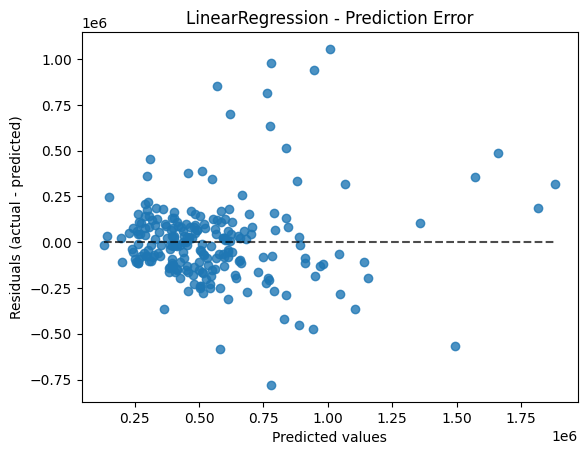

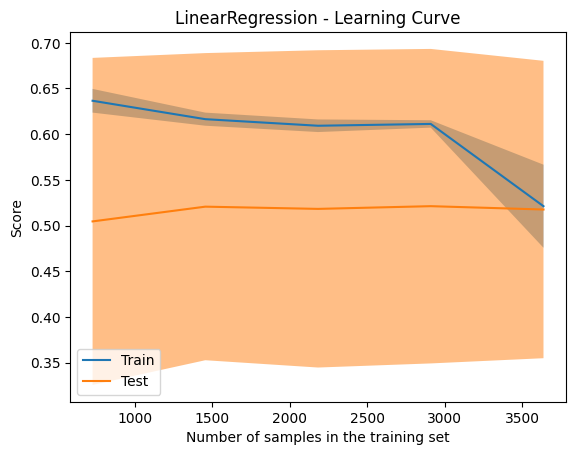

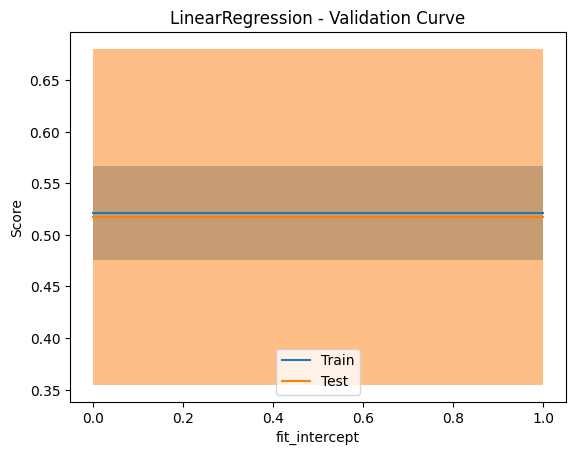

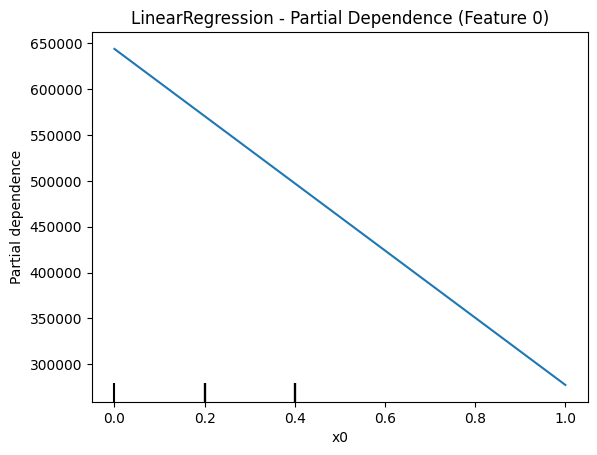

Permutation importance skipped: name 'permutation_importance' is not defined


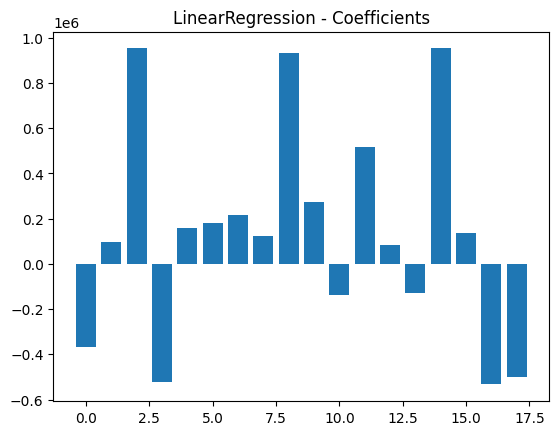

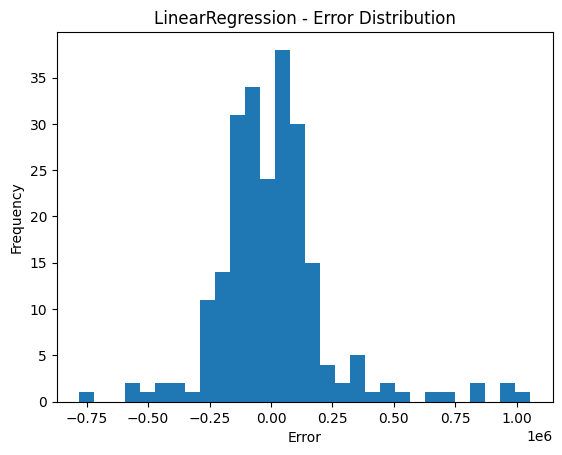




Model: DecisionTreeRegressor
Mean squared error: 104987946390.59
Coefficient of determination: 0.23



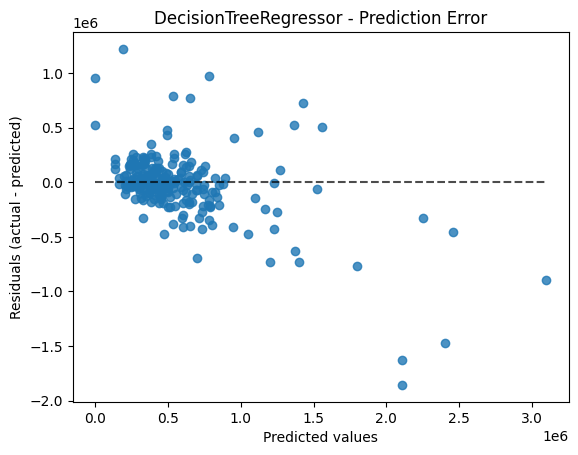

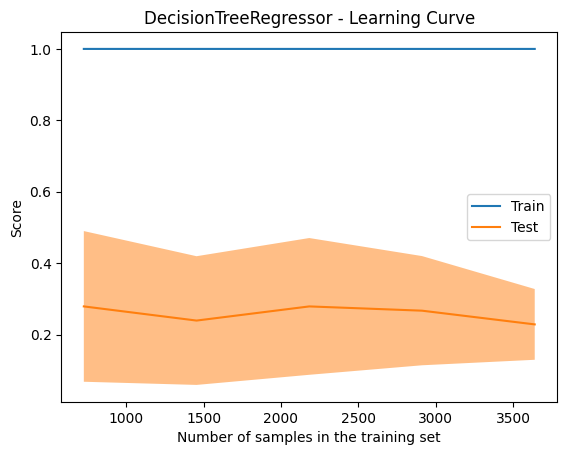

Validation curve skipped: Invalid parameter 'fit_intercept' for estimator DecisionTreeRegressor(). Valid parameters are: ['ccp_alpha', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'monotonic_cst', 'random_state', 'splitter'].


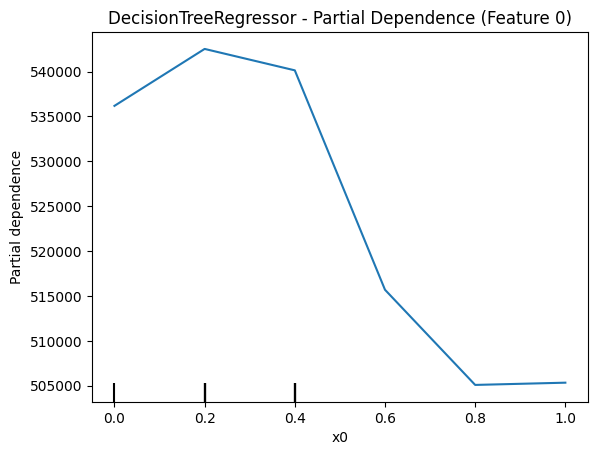

Permutation importance skipped: name 'permutation_importance' is not defined


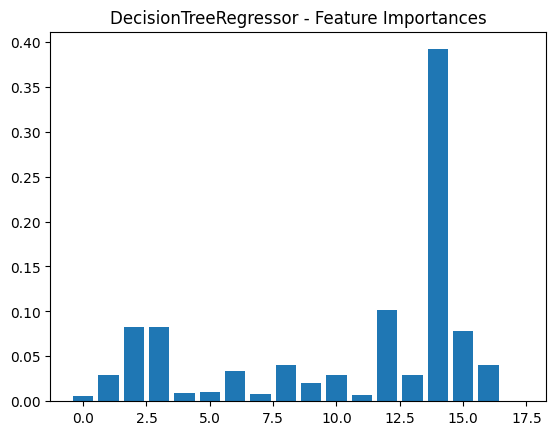

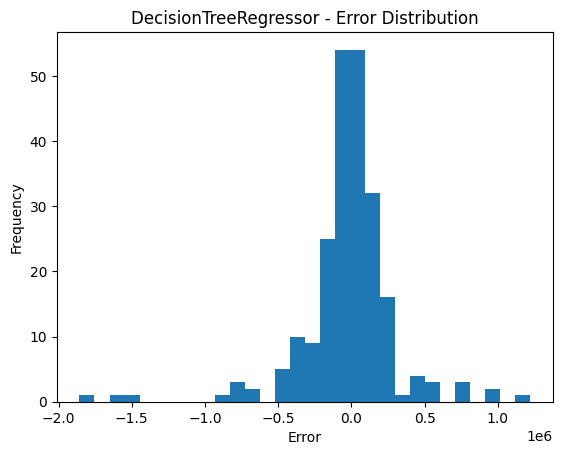




Model: RandomForestRegressor
Mean squared error: 50070338715.68
Coefficient of determination: 0.63



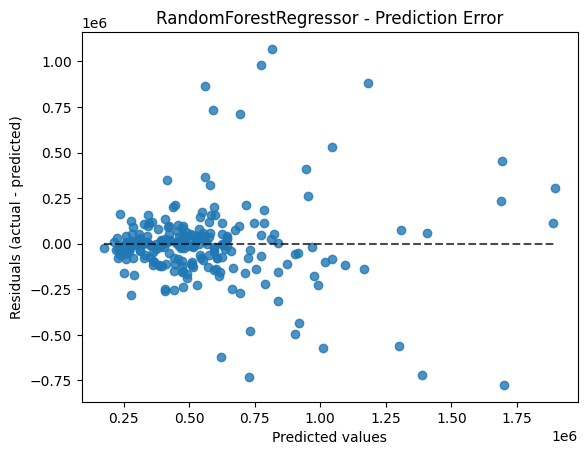

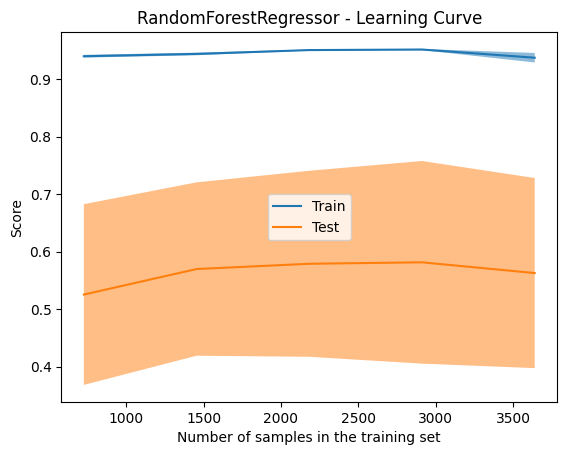

Validation curve skipped: Invalid parameter 'fit_intercept' for estimator RandomForestRegressor(). Valid parameters are: ['bootstrap', 'ccp_alpha', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'max_samples', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'monotonic_cst', 'n_estimators', 'n_jobs', 'oob_score', 'random_state', 'verbose', 'warm_start'].


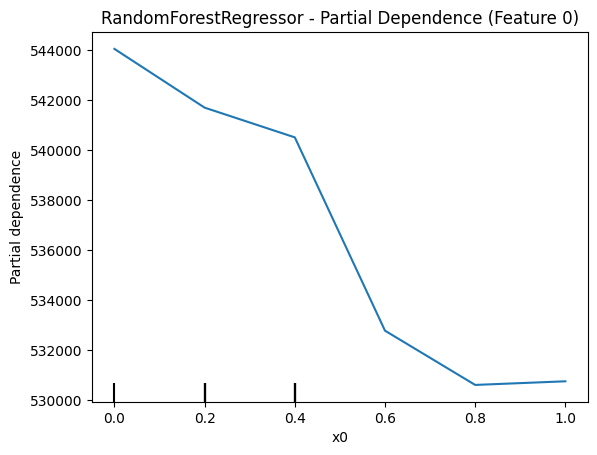

Permutation importance skipped: name 'permutation_importance' is not defined


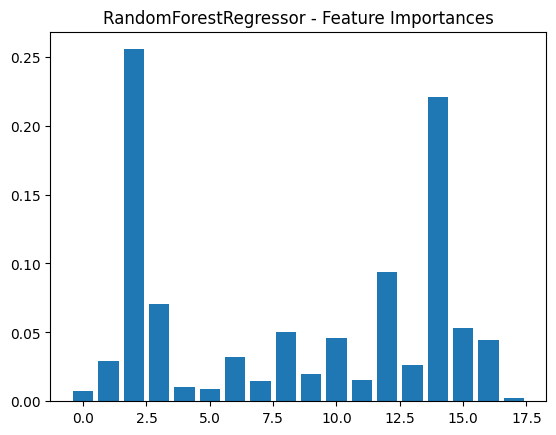

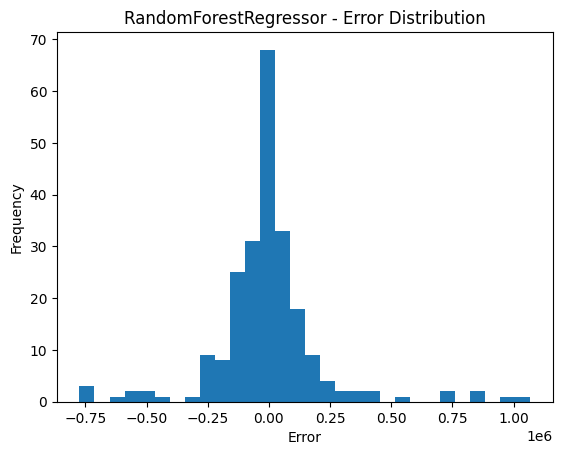




Model: XGBRegressor
Mean squared error: 52146163752.24
Coefficient of determination: 0.62



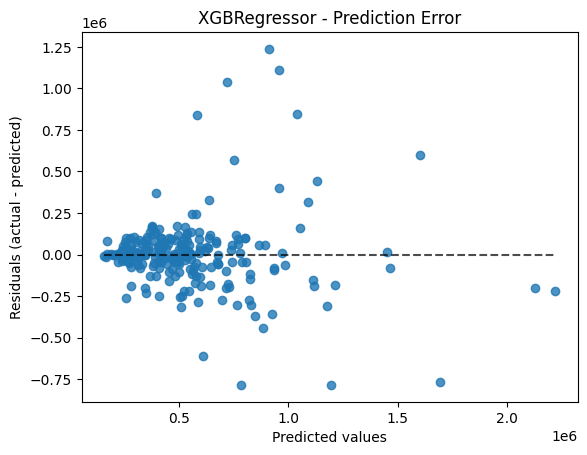

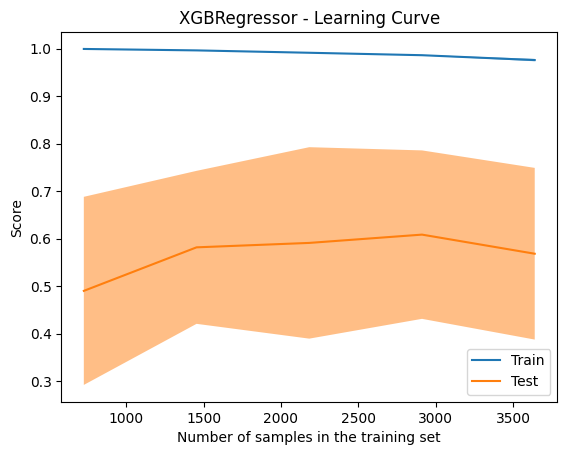

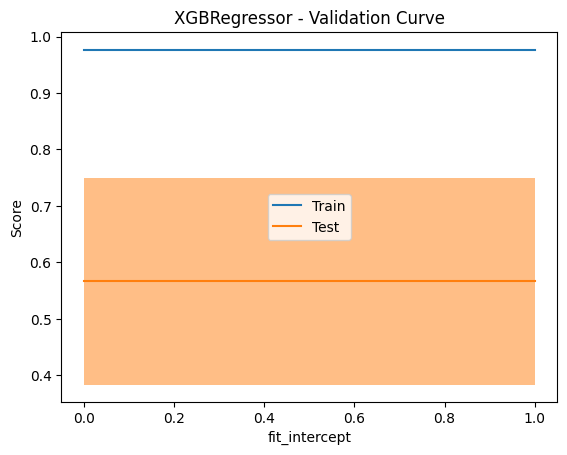

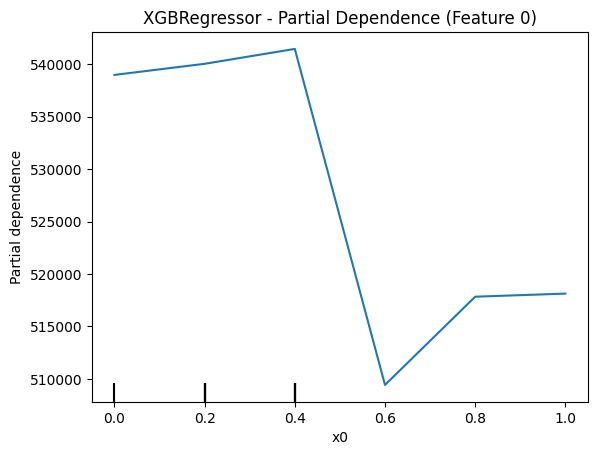

Permutation importance skipped: name 'permutation_importance' is not defined


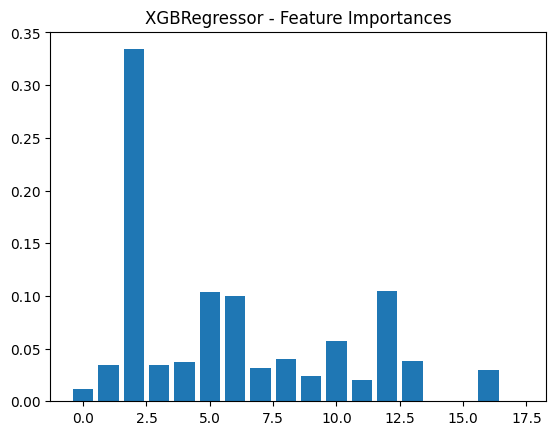

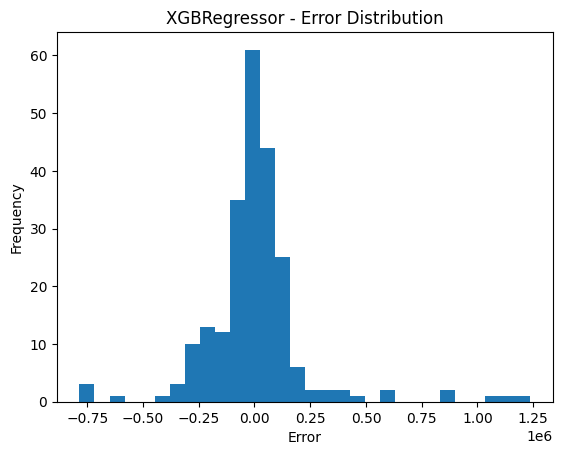




Model: KNeighborsRegressor
Mean squared error: 66130177237.70
Coefficient of determination: 0.52



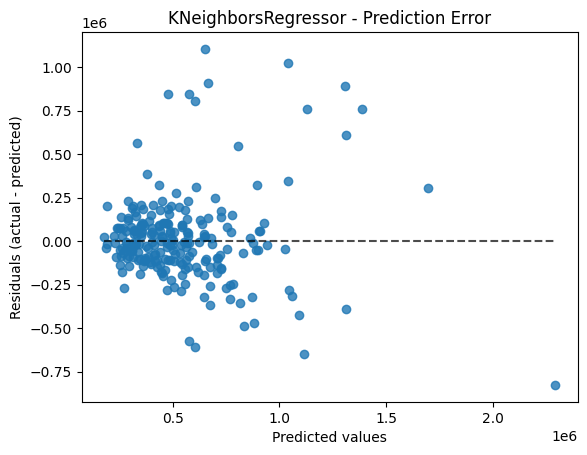

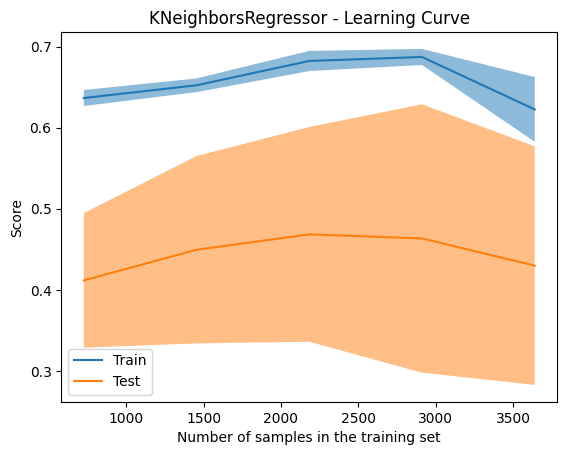

Validation curve skipped: Invalid parameter 'fit_intercept' for estimator KNeighborsRegressor(). Valid parameters are: ['algorithm', 'leaf_size', 'metric', 'metric_params', 'n_jobs', 'n_neighbors', 'p', 'weights'].


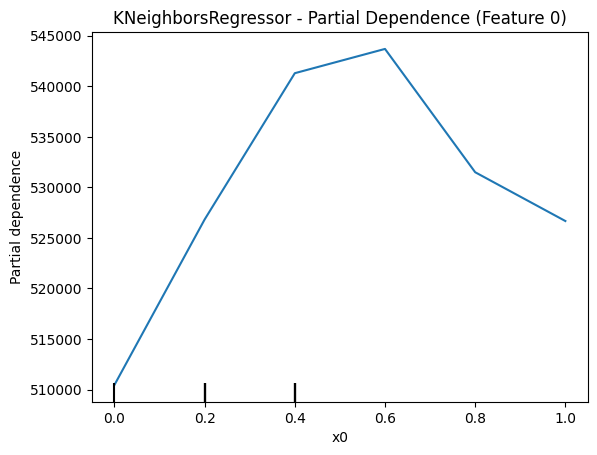

Permutation importance skipped: name 'permutation_importance' is not defined


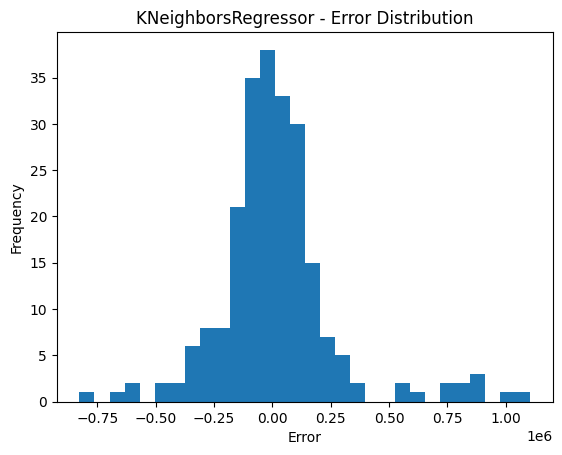

In [50]:
call_model(LinearRegression)
call_model(DecisionTreeRegressor)
call_model(RandomForestRegressor)
call_model(XGBRegressor)
call_model(KNeighborsRegressor)